# 🐶 End-to-end Multiclass dog breed classification

> This notebook builds an end to end multiclass image classifier using TF 2.0 and TF Hub.

## 1. Problem

> Identifying the breed of a dog given an image.

## 2. Data

> https://www.kaggle.com/c/dog-breed-identification


## 3. Evaluation

> The evaluation metric is a file with prediction probabilities of each test image. (Multi class log loss)

## 4. Features

> Some information about the data:
* We're dealing with images (unstructured data), so we use deep learning
* There are 120 dog breeds, so multi class classification
* There around 10000+ images in training and test sets

In [ ]:
#Unzipping the uploaded data into Google Drive

#!unzip "/content/drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision/"

### Getting our workspace ready

* Import TensorFlow 2.x
* Import TensorFlow Hub
* Make sure we're using a GPU

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

#Checking for GPU availibility
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not availible")

TF version: 2.9.2
TF Hub version: 0.12.0
GPU available


## Turning our data into tensors



In [ ]:
import pandas as pd

labels_csv = pd.read_csv("drive/My Drive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


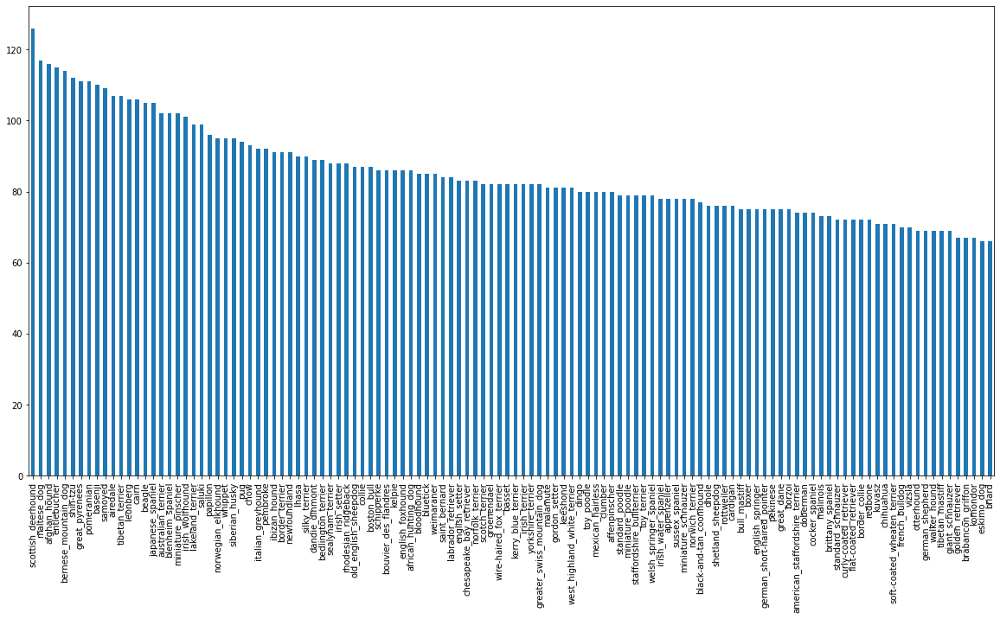

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize = (20,10))

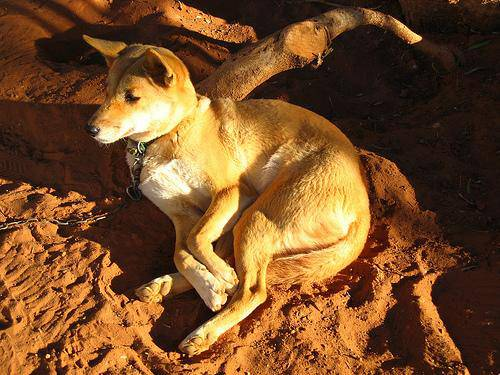

In [ ]:
# Viewing an image inside colab
from IPython.display import Image
Image("drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels



In [ ]:
# Creat pathnames from image IDS

filenames = ["drive/My Drive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]
filenames[:10]

['drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Checking number of filenames

import os

if len(os.listdir("drive/My Drive/Dog Vision/train/")) == len(filenames):
  print("Correct number of file names")
else:
  print("Incorrect number of file names")

Correct number of file names


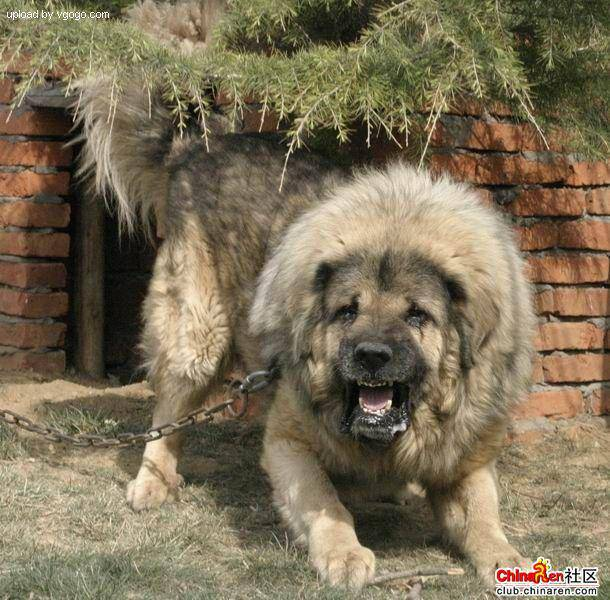

In [ ]:
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

In [ ]:
# Converting image labels into numbers 
import numpy as np

labels = np.array(labels_csv["breed"])
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
#Turning every label into a boolean array

boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:1]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False])]

In [ ]:
print(labels[0])
print(np.where(unique_breeds == labels[0]))
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
# Creating our validation set 
x = filenames
y = boolean_labels


In [ ]:
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
from sklearn.model_selection import train_test_split

x_train, x_valid, y_train, y_valid = train_test_split(x[:NUM_IMAGES],
                                                      y[:NUM_IMAGES],
                                                      random_state = 42,
                                                      test_size = 0.2)
len(x_train), len(y_train), len(x_valid), len(y_valid)

(800, 800, 200, 200)

In [ ]:
x_train[:5], y_train[:2]

(['drive/My Drive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/My Drive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/My Drive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/My Drive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/My Drive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, Fa

## Preprocessing Images by turning images into Tensors

1. Take an image filepath as input
2. Use TF to read the file and save it to a variable
3. Turn our image into a Tensor
4. Normalize our image
5. Resize our image to be (224,224)
6. Return the modified image

In [ ]:
from matplotlib.pyplot import imread

image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

In [ ]:
IMG_SIZE = 224 

def process_image(image_path, img_size = IMG_SIZE):
  """
  Takes an image filepath and turns it into a resized tensor
  """

  #Read an image file
  image = tf.io.read_file(image_path)
  
  #Turn jpg into numerical Tensor with 3 color channels
  image = tf.image.decode_jpeg(image, channels = 3)

  #Normalize color channel values
  image = tf.image.convert_image_dtype(image, tf.float32)

  #Resizing the image
  image = tf.image.resize(image, size = [img_size, img_size])

  return image
  


### Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go. They might not all fit into memory. 

That is why we use batches, and the industry standard is 32.

Furthermore, in order to use TF properly, we need our data in tensor tuples in the form of:
`(image, label)`

We will send 32 of these tuples at a time to TF.

In [ ]:
# Creating a function to return a tuple of tensors

def get_image_label(image_path, label):
  """
  Takes an image file path name, processes it, and then returns a tuple.
  """


  image = process_image(image_path)
  return image, label



In [ ]:
# Creating a function to create batches of 32 tuples

BATCH_SIZE = 32

def create_data_batches(x, y = None, batch_size = BATCH_SIZE,
                        valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (Y) pairs.
  Shuffles the data if it's training data, but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels)
  """

  # If the data is a test data set, we have no labels
  if test_data:
    print("Creating test data batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x)))
    data_batch = data.map(process_image).batch(batch_size)
    return data_batch

  # If the data is a valid dataset, no need to shuffle
  elif valid_data:
    print("Creating valid data batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                               tf.constant(y)))
    data_batch = data.map(get_image_label).batch(batch_size)
    return data_batch

  # If the data is a training set, shuffle it too
  else:
    print("Creating training data batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                               tf.constant(y)))
    data = data.shuffle(buffer_size=len(x))
    data_batch = data.map(get_image_label).batch(batch_size)
    return data_batch



In [ ]:
# Create training and validation data batches
train_data = create_data_batches(x_train, y_train)
val_data = create_data_batches(x_valid, y_valid, valid_data = True)

Creating training data batches
Creating valid data batches


In [ ]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

In [ ]:
import matplotlib.pyplot as plt

def  show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """

  plt.figure(figsize=(10,10))

  for i in range(25):
    ax = plt.subplot(5, 5, i + 1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
len(train_images), len(train_labels)

(32, 32)

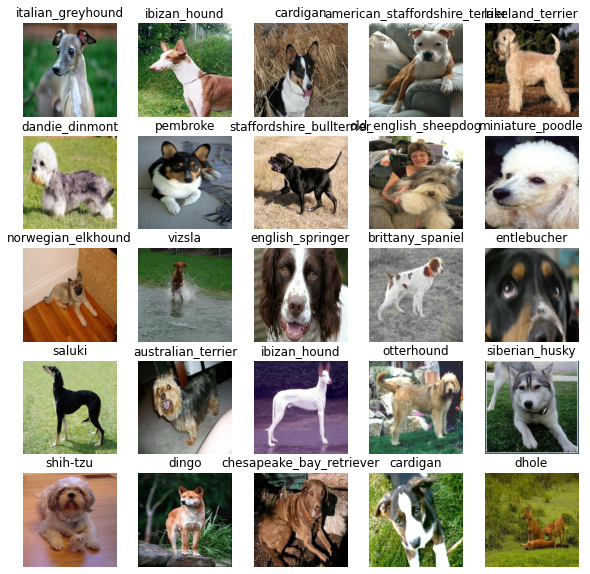

In [ ]:
show_25_images(train_images, train_labels)

### Building a model

Before we build a model, there are requirements:
* The input shape 
* The output shape
* The URL of the model being using

In [ ]:
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]
OUTPUT_SHAPE = len(unique_breeds)
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"


Now we use our inputs, outputs and model into a keras deep learning model

In [ ]:
def create_model(input_shape = INPUT_SHAPE, output_shape= OUTPUT_SHAPE,
                 model_url = MODEL_URL):
  
  print("Building model with: ", model_url)

  #Setup model layers
  model = tf.keras.Sequential([
          hub.KerasLayer(model_url), #Layer 1 (Inputs)
          tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                                activation="softmax") #Layer 2 (Outputs)
          ])

  #Compiling model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  model.build(INPUT_SHAPE)

  return model

In [ ]:
from sklearn import model_selection
model = create_model()
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating Callbacks 

In [ ]:
%load_ext tensorboard

In [ ]:
import datetime

def create_tensorboard_callback():

  logdir = os.path.join("/content/drive/MyDrive/Dog Vision/logs",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  
  return tf.keras.callbacks.TensorBoard(logdir)
  

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "val_accuracy",
                                                  patience = 3)

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}


In [ ]:
def train_model():

  model = create_model()

  tensorboard = create_tensorboard_callback()

  model.fit(x=train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  
  return model

In [ ]:
%time
model = train_model()

CPU times: user 2 µs, sys: 1e+03 ns, total: 3 µs
Wall time: 4.53 µs
Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 131s 5s/step - loss: 4.5741 - accuracy: 0.1075 - val_loss: 3.4694 - val_accuracy: 0.2550
Epoch 2/100
25/25 [==============================] - 3s 121ms/step - loss: 1.6451 - accuracy: 0.6938 - val_loss: 2.1541 - val_accuracy: 0.5200
Epoch 3/100
25/25 [==============================] - 3s 118ms/step - loss: 0.5780 - accuracy: 0.9337 - val_loss: 1.6291 - val_accuracy: 0.6450
Epoch 4/100
25/25 [==============================] - 3s 117ms/step - loss: 0.2581 - accuracy: 0.9862 - val_loss: 1.4376 - val_accuracy: 0.6750
Epoch 5/100
25/25 [==============================] - 3s 117ms/step - loss: 0.1486 - accuracy: 0.9975 - val_loss: 1.3559 - val_accuracy: 0.6950
Epoch 6/100
25/25 [==============================] - 3s 117ms/step - loss: 0.1016 - accuracy: 0.9987 - val_loss: 1.3034 - va

In [ ]:
%tensorboard --logdir /content/drive/My\ Drive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

In [ ]:
predictions = model.predict(val_data,
                            verbose = 1)

7/7 [==============================] - 1s 93ms/step


In [ ]:
def get_pred_label(pred_prob):

  return unique_breeds[np.argmax(pred_prob)]

pred_label = get_pred_label(predictions[0])
pred_label

'cairn'

In [ ]:
def unbatch_data(data):

  images_ = []
  labels_ = []

  for image, label in data.unbatch().as_numpy_iterator():

    images_.append(image)
    labels_.append(unique_breeds[np.argmax(label)])

  return images_, labels_

In [ ]:
val_images, val_labels = unbatch_data(val_data)

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):

  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  pred_label = get_pred_label(pred_prob)

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob) * 100,
                                    true_label))

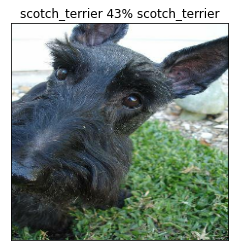

In [ ]:
plot_pred(predictions, val_labels, val_images, 1)

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n = 1):

  pred_prob, true_label = prediction_probabilities[n], labels[n]

  pred_label = get_pred_label(pred_prob)
                              
  top_10_pred_index = pred_prob.argsort()[-10:][::-1]

  top_10_pred_vals = pred_prob[top_10_pred_index]

  top_10_pred_labels = unique_breeds[top_10_pred_index]

  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_vals,
                     color = "grey")
  
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation = "vertical")

  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")

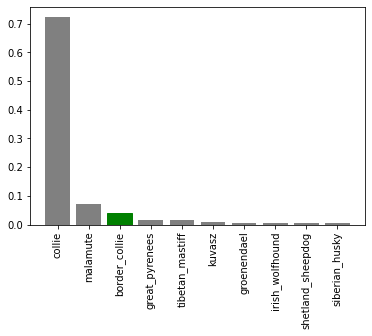

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels = val_labels,
               n = 9)

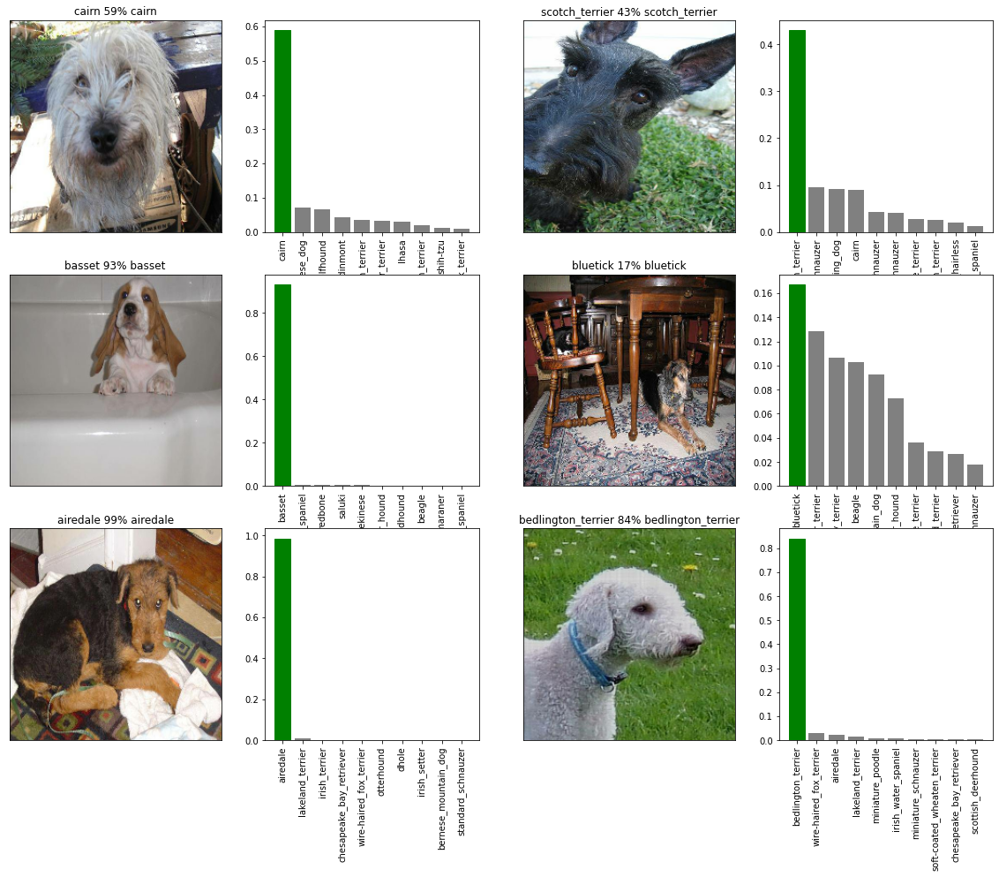

In [ ]:
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10* num_cols, 5* num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i + 1)
  plot_pred(prediction_probabilities=predictions,
            labels = val_labels,
            images = val_images,
            n = i + i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i + 2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels = val_labels,
                 n = i + i_multiplier)

In [ ]:
def save_model(model, suffix = None):

  modeldir = os.path.join("/content/drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%m-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5"
  model.save(model_path)

  return model_path

In [ ]:
def load_model(model_path):

  model = tf.keras.models.load_model(model_path,
                                     custom_objects = {"KerasLayer":hub.KerasLayer})
  
  return model

In [ ]:
save_model(model, "1000-images-Adam")

'/content/drive/MyDrive/Dog Vision/models/20230101-23361674344205-1000-images-Adam.h5'

In [ ]:
model.evaluate(val_data)

7/7 [==============================] - 1s 115ms/step - loss: 1.2594 - accuracy: 0.6800


[1.259436011314392, 0.6800000071525574]

In [ ]:
full_data = create_data_batches(x,y)

Creating training data batches


In [ ]:
full_model = create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
full_model_tensorboard = create_tensorboard_callback()
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor= "accuracy",
                                                             patience = 3)


In [ ]:
full_model.fit(x = full_data,
               epochs = NUM_EPOCHS, 
               callbacks = [full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 34s 94ms/step - loss: 1.3496 - accuracy: 0.6726
Epoch 2/100
320/320 [==============================] - 31s 96ms/step - loss: 0.4041 - accuracy: 0.8772
Epoch 3/100
320/320 [==============================] - 31s 98ms/step - loss: 0.2363 - accuracy: 0.9348
Epoch 4/100
320/320 [==============================] - 30s 93ms/step - loss: 0.1544 - accuracy: 0.9611
Epoch 5/100
320/320 [==============================] - 30s 93ms/step - loss: 0.1056 - accuracy: 0.9793
Epoch 6/100
320/320 [==============================] - 30s 93ms/step - loss: 0.0764 - accuracy: 0.9865
Epoch 7/100
320/320 [==============================] - 30s 93ms/step - loss: 0.0583 - accuracy: 0.9932
Epoch 8/100
320/320 [==============================] - 30s 93ms/step - loss: 0.0461 - accuracy: 0.9953
Epoch 9/100
320/320 [==============================] - 30s 93ms/step - loss: 0.0379 - accuracy: 0.9961
Epoch 10/100
320/320 [==============================] - 30s 93ms/step - l

In [ ]:
save_model(full_model, suffix = "full-data")

'/content/drive/MyDrive/Dog Vision/models/20230101-23521674345171-full-data.h5'

In [ ]:
full_model.evaluate(full_data)

320/320 [==============================] - 31s 96ms/step - loss: 0.0105 - accuracy: 0.9991


[0.01052099745720625, 0.9991195201873779]

In [ ]:
test_path = "drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

test_data = create_data_batches(test_filenames, test_data = True)


Creating test data batches


In [ ]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
test_predictions = full_model.predict(test_data,
                                      verbose = 1)

324/324 [==============================] - 145s 94ms/step
